# Tabular LIME - Examples

In [ ]:
from pathlib import Path

OUT_DIR = Path("out")
OUT_DIR.mkdir(parents=True, exist_ok=True)

def out_path(filename):
    return OUT_DIR / filename


## 2D Indicator

Experiment 1 / 10 is running...
Experiment 2 / 10 is running...
Experiment 3 / 10 is running...
Experiment 4 / 10 is running...
Experiment 5 / 10 is running...
Experiment 6 / 10 is running...
Experiment 7 / 10 is running...
Experiment 8 / 10 is running...
Experiment 9 / 10 is running...
Experiment 10 / 10 is running...


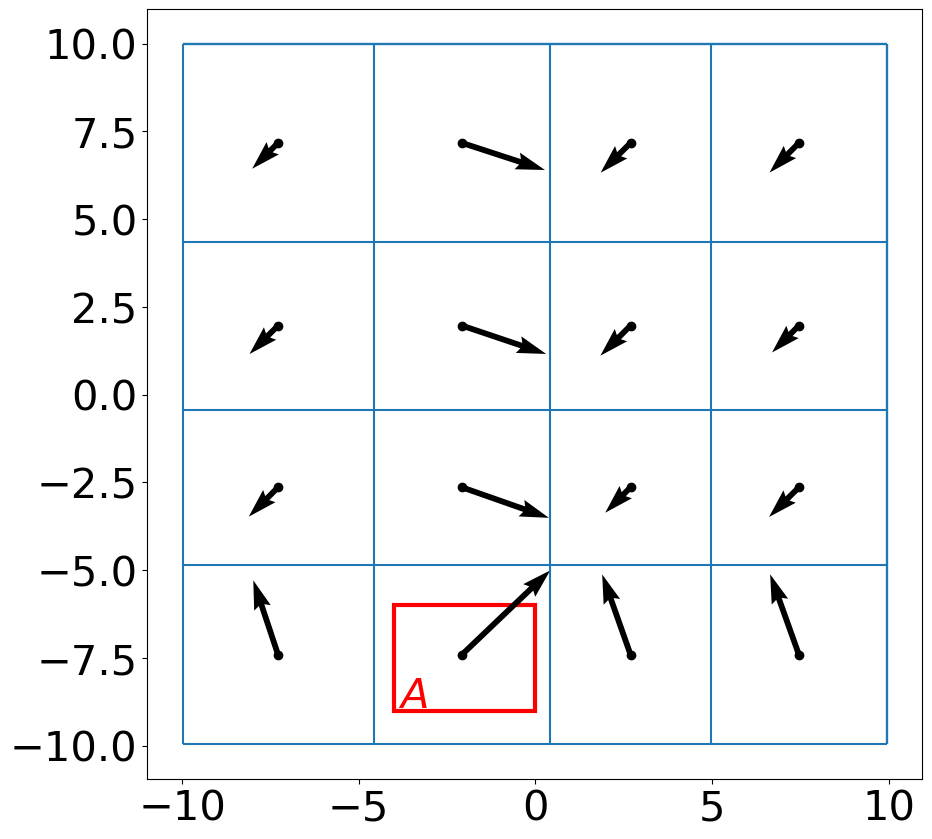

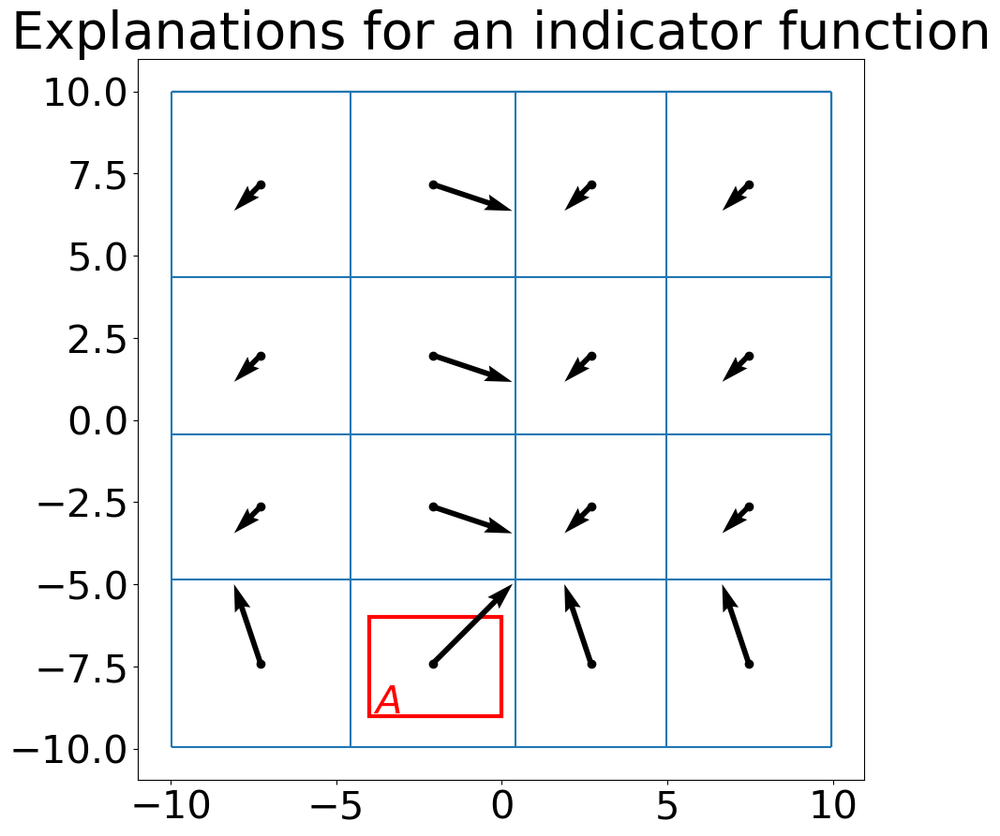

In [1]:
# -*- coding: utf-8 -*-
"""

@author: dgarreau

Looking at explanations for an indicator function with rectangular support in 
dimension 2. Since the explanations do not depend on the exact value of xi, 
we plot one explanation per 2-dimensional bin at the center. This is Figure 10 
in the paper.

"""


import numpy as np
import matplotlib.pyplot as plt

import lime
import lime.lime_tabular

from utils.aux_functions import get_training_data_stats
from utils.aux_functions import get_grid_params
from utils.aux_functions import format_coefs

from utils.plot_functions import plot_grid

from theory.indicator import compute_beta_indicator

if __name__ == "__main__":
    
    # number of experiments
    n_exp = 10
    
    # number of perturbed samples
    n_samples = 1000
    
    # for reproducibility
    np.random.seed(3)

    # we work in 2D
    dim = 2

    # the model to explain is an indicator function with rectangular support
    rect = np.array([[-4,0],[-9,-6]])
    def my_model(array):
        n_sample,dim = array.shape
        res = np.zeros((n_sample,))
        for i in range(n_sample):
            x = array[i]
            if x[0] > rect[0,0] and x[0] < rect[0,1] and x[1] > rect[1,0] and x[1] < rect[1,1]:
                res[i] = 1
        return res

    # uniform training data
    x_min = -10
    x_max = 10
    y_min = x_min
    y_max = x_max
    n_train = 1000
    train = np.random.uniform(x_min,x_max,(n_train,dim))

    # bandwidth parameter
    nu = 10
    
    # number of bins along each dimension
    p = 4

    # getting summary statistics of the train data
    my_stats = get_training_data_stats(train,p)
    
    # getting the parameters of the grid            
    bins_middle_points,bins_left_boundaries,bins_right_boundaries = get_grid_params(my_stats)
    
    # creating the explainer
    explainer = lime.lime_tabular.LimeTabularExplainer(train, 
                                                       mode='regression',
                                                       feature_selection='none',
                                                       training_data_stats=my_stats,
                                                       kernel_width=nu)

    # we will store the empirical explanations in this array
    beta_emp_store = np.zeros((p,p,n_exp,dim+1))
    
    # main loop
    for i_exp in range(n_exp):
        
        if np.mod(i_exp + 1,1) == 0:
            s_exp = "Experiment {} / {} is running...".format(i_exp + 1,n_exp)
            print(s_exp)
        
        # traversing the grid
        for i in range(p):
            for j in range(p):
                
                # taking xi in the middle of the box 
                xi = np.array([bins_middle_points[i,j,0],bins_middle_points[i,j,1]])
                
                # getting the explanation
                exp = explainer.explain_instance(xi, 
                                                 my_model, 
                                                 num_samples=n_samples)

                # getting the coefficients of the local model
                beta_emp_store[i,j,i_exp,:] = format_coefs(exp)
                

    # averaging over all experiments
    beta_mean = np.mean(beta_emp_store[:,:,:,1:],2)

    # looking at the norm can help to fix the size of the arrows
    beta_norm = np.zeros((p,p))
    for i in range(p):
        for j in range(p):
            beta_norm[i,j] = np.linalg.norm(beta_mean[i,j,:])

    # theoretical values
    beta_theo = np.zeros((p,p,2))
    for i in range(p):
        for j in range(p):
            xi = np.array([bins_middle_points[i,j,0],bins_middle_points[i,j,1]])
            beta_theo[i,j,:] = compute_beta_indicator(xi,rect,nu,my_stats)[1:]
           
    ###########################################################################

    center = rect
        
    # first figure: empirical
    fig, ax = plt.subplots(figsize=(10,10))
    plot_grid(beta_mean,
              ax,
              my_stats,
              center,
              scale=25)


        
    # saving the fig
    s_name = str(out_path("two-dimensional_tree_vector_field_empirical"))
    fig.savefig(s_name + '.pdf',format='pdf',bbox_inches = 'tight',pad_inches = 0)  
 
    
    
        
    # second figure: theory
    fig, ax = plt.subplots(figsize=(10,10))
    plot_grid(beta_theo,
              ax,
              my_stats,
              center,
              title="Explanations for an indicator function",
              scale=25)
        
    # saving the fig
    s_name = str(out_path("2D_indicator"))
    fig.savefig(s_name + '.pdf',format='pdf',bbox_inches = 'tight',pad_inches = 0)  
            

## Empirical vs. Theory Indicator

Experiment 10 / 100 is running...
Experiment 20 / 100 is running...
Experiment 30 / 100 is running...
Experiment 40 / 100 is running...
Experiment 50 / 100 is running...
Experiment 60 / 100 is running...
Experiment 70 / 100 is running...
Experiment 80 / 100 is running...
Experiment 90 / 100 is running...
Experiment 100 / 100 is running...


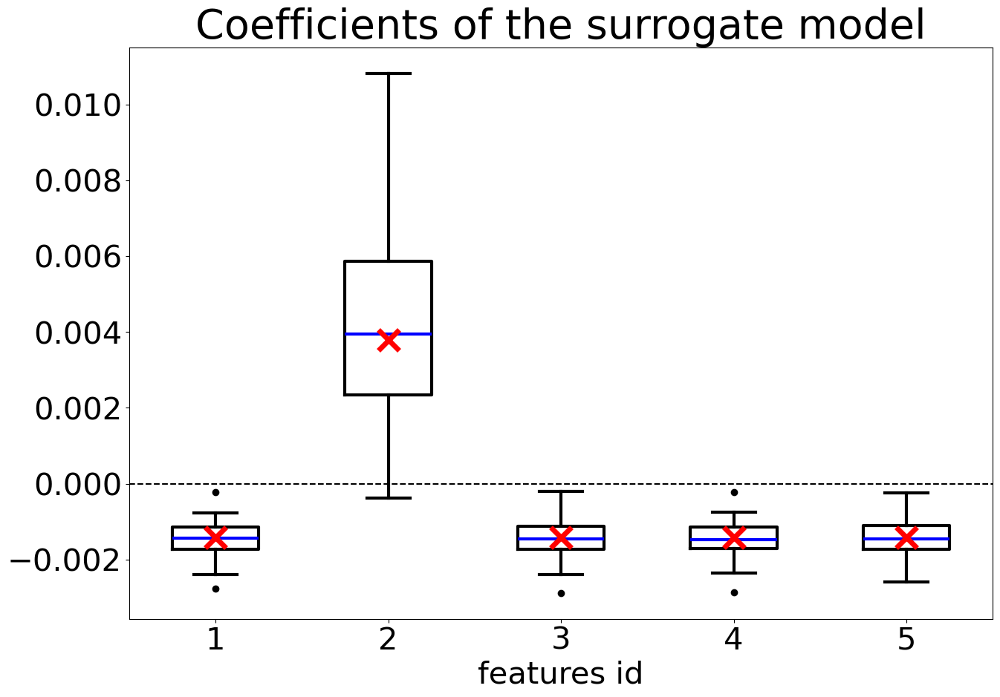

In [ ]:
# -*- coding: utf-8 -*-
"""

@author: dgarreau

Theory vs practice for an indicator function. In this script, we confront 
Theorem 1 (more precisely Proposition 6) to empirical observations. The result 
is Figure 16 in the paper.

"""
import numpy as np
import matplotlib.pyplot as plt

import lime
import lime.lime_tabular

from utils.aux_functions import get_training_data_stats
from utils.aux_functions import format_coefs
from utils.plot_functions import plot_whisker_boxes

from theory.indicator import compute_beta_indicator

if __name__ == "__main__":
    
    # number of experiments
    n_exp = 100
    
    # number of samples (here we need a lot since f is mostly flat)
    n_samples = 10000
    
    # for reproducibility
    np.random.seed(1)

    # dimension of the ambient space
    dim = 5

    # our model is an indicator function with rectangular support
    rect = np.zeros((dim,2))
    rect[:,0] = 2.5*np.ones((dim,))
    rect[:,1] = 7.5*np.ones((dim,))
    def my_model(array):
        n_sample,dim = array.shape
        res = np.zeros((n_sample,))
        for i in range(n_sample):
            x = array[i,:]
            if np.all(x > rect[:,0]) and np.all(x < rect[:,1]):
                res[i] = 1
                
        return res

    # the example to explain
    xi = np.random.uniform(-10,10,(dim,))

    # training set
    n_train = 1000
    train = np.random.uniform(-10,10,(n_train,dim))

    # bandwidth parameter
    nu = 10
    
    # number of bins along each dimension
    p = 10

    # creating the discretizer
    my_stats = get_training_data_stats(train,p)

    # creating the explainer
    explainer = lime.lime_tabular.LimeTabularExplainer(train, 
                                                       mode='regression',
                                                       feature_selection='none',
                                                       training_data_stats=my_stats,
                                                       kernel_width=nu)

    beta_emp_store = np.zeros((n_exp,dim+1))
    for i_exp in range(n_exp):
        
        if np.mod(i_exp + 1,10) == 0:
            s_exp = "Experiment {} / {} is running...".format(i_exp + 1,n_exp)
            print(s_exp)
        
        # getting the explanation
        exp = explainer.explain_instance(xi, 
                                         my_model, 
                                         num_samples=n_samples)

        # getting the coefficients of the local model
        beta_emp_store[i_exp,:] = format_coefs(exp)

    # computing the theoretical values
    beta_theo = compute_beta_indicator(xi,rect,nu,my_stats)

    ###########################################################################
    
    # plotting the results
    fig, ax = plt.subplots(figsize=(15,10))
    plot_whisker_boxes(beta_emp_store,
                           ax,
                           theo=beta_theo)
        
    # saving the fig
    s_name = str(out_path("indicator_explanation"))
    fig.savefig(s_name + '.pdf',format='pdf',bbox_inches = 'tight',pad_inches = 0) 

## 2D Tree

Experiment 10 / 100 is running...
Experiment 20 / 100 is running...
Experiment 30 / 100 is running...
Experiment 40 / 100 is running...
Experiment 50 / 100 is running...
Experiment 60 / 100 is running...
Experiment 70 / 100 is running...
Experiment 80 / 100 is running...
Experiment 90 / 100 is running...
Experiment 100 / 100 is running...


/var/folders/k7/xf0yhfbs02ggfm7n1l5g_cnm0000gn/T/ipykernel_29009/1636942206.py:124: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  values[i,j] = goal_function(np.array([x[j],y[i]]).reshape(1,-1))
/var/folders/k7/xf0yhfbs02ggfm7n1l5g_cnm0000gn/T/ipykernel_29009/1636942206.py:124: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  values[i,j] = goal_function(np.array([x[j],y[i]]).reshape(1,-1))
/var/folders/k7/xf0yhfbs02ggfm7n1l5g_cnm0000gn/T/ipykernel_29009/1636942206.py:124: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before per

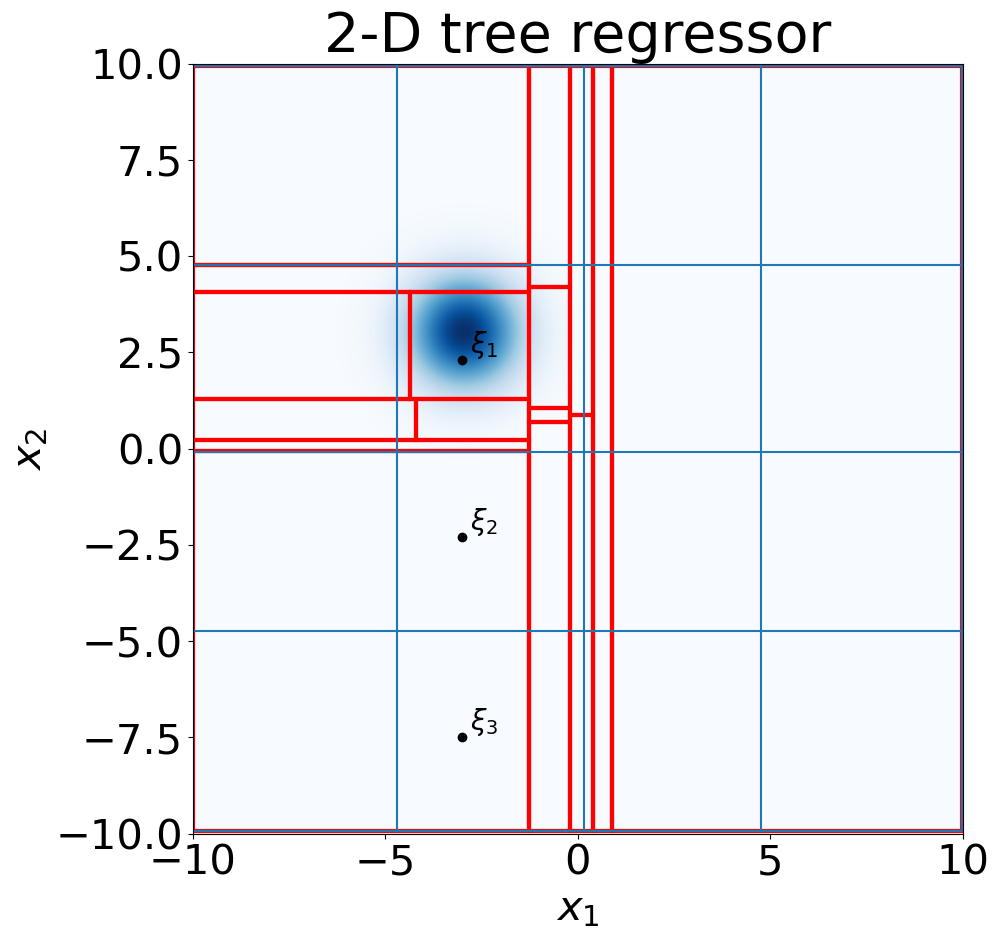

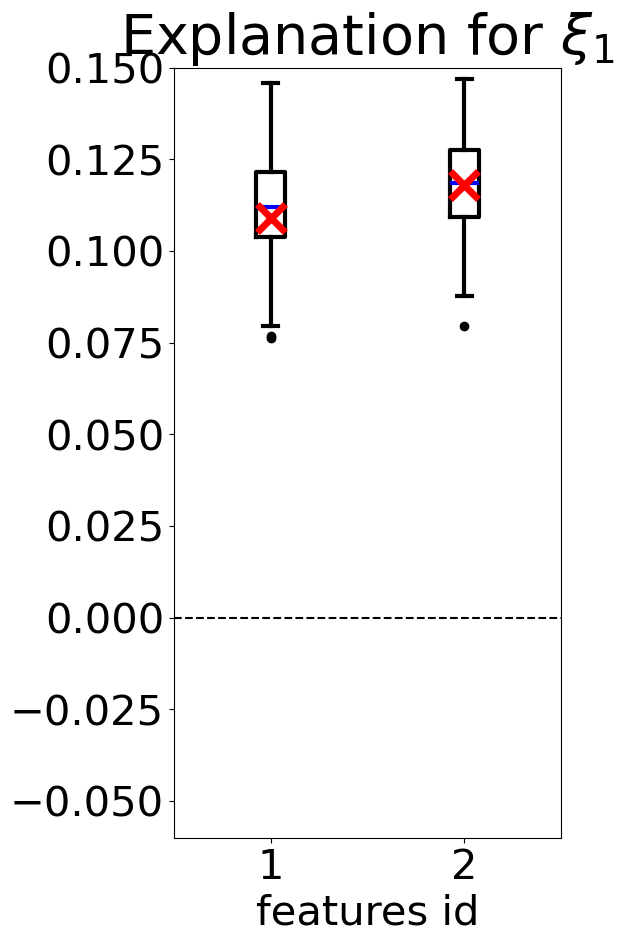

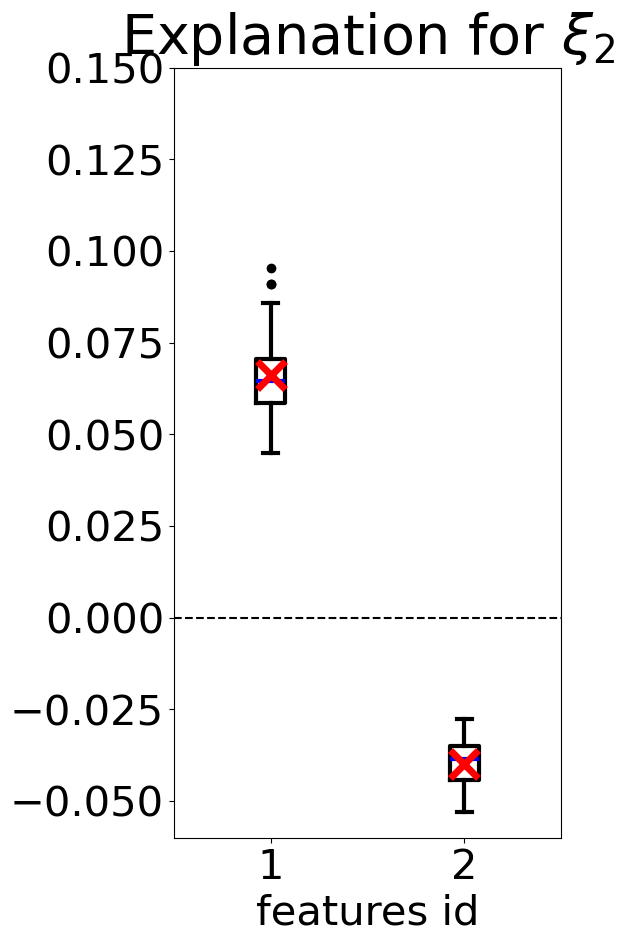

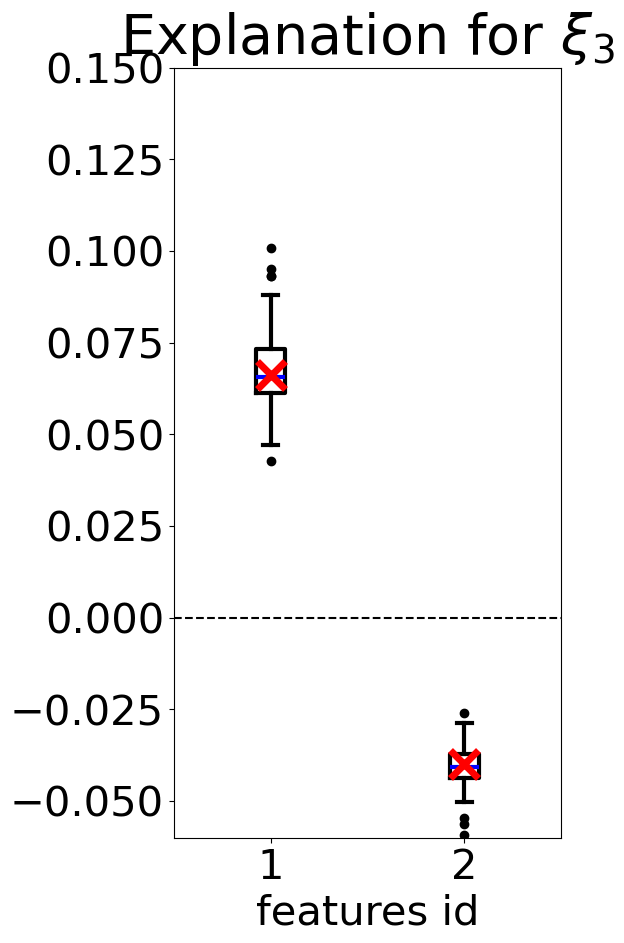

In [2]:
# -*- coding: utf-8 -*-
"""

@author: dgarreau

In this script, we look into the LIME explanations for a CART tree in 2D. This 
CART tree is trained on a bump in the upper left corner of the [-10,10]^2 
square. As predicted by the theory, all the xi that are aligned with the bump 
along a given coordinate receive a positive explanation, whereas the function 
to explain is very flat in the vidinity of xi. This is Figure 12 in the paper. 

"""

import numpy as np
import numpy.matlib
import matplotlib.pyplot as plt

import lime
import lime.lime_tabular

from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics.pairwise import rbf_kernel

import matplotlib.cm as cm

from utils.aux_functions import get_training_data_stats
from utils.aux_functions import get_partition
from utils.aux_functions import format_coefs
from utils.aux_functions import uniform_sample
from utils.aux_functions import get_empirical_boundaries

from utils.plot_functions import plot_partition,plot_bins,plot_whisker_boxes

from theory.tree import compute_beta_tree

if __name__ == "__main__":
 
    # number of experiments
    n_exp = 100
    
    # number of perturbed samples
    n_samples = 1000
    
    # bandwidth parameter
    nu = 1

    # number of bins along each dimension
    p = 4
    
    # for reproducibility
    np.random.seed(3)

    # dimension of the ambient space
    dim = 2
    
    # we work on the [-10,10]^2 square
    theo_boundaries = np.zeros((dim,2))
    theo_boundaries[:,0] = -10*np.ones((dim,))
    theo_boundaries[:,1] = 10*np.ones((dim,))

    # function to regress is a bump in the upper-left corner
    zeta = np.array([-3,3])
    def goal_function(data):
        return rbf_kernel(data,zeta.reshape(1, -1))

    # training set
    n_train = 1000
    train_data = uniform_sample(theo_boundaries,n_train)
    
    # getting summary statistics of the train data
    my_stats = get_training_data_stats(train_data,p)

    # creating the tree regressor
    depth = 4
    tree_reg = DecisionTreeRegressor(random_state=0,max_depth=depth)
    
    # train to fit the goal function
    tree_reg.fit(train_data,goal_function(train_data))

    # examples to explain 
    xi_1 = np.array([-3,2.3])
    xi_2 = np.array([-3,-2.3])
    xi_3 = np.array([-3,-7.5])
    xi_list = [xi_1,xi_2,xi_3]
    n_xi = len(xi_list)
    
    # let us get the empirical explanations
    explainer = lime.lime_tabular.LimeTabularExplainer(train_data, 
                                                       mode='regression',
                                                       feature_selection='none',
                                                       training_data_stats=my_stats,
                                                       kernel_width=nu)
    
    # main loop
    beta_emp_store = np.zeros((n_exp,dim+1,n_xi))
    for i_exp in range(n_exp):
        
        if np.mod(i_exp + 1,10) == 0:
            s_exp = "Experiment {} / {} is running...".format(i_exp + 1,n_exp)
            print(s_exp)
        
        for i_xi in range(n_xi):
            xi = xi_list[i_xi]
            exp = explainer.explain_instance(xi,tree_reg.predict,num_samples=n_samples)
            beta_emp_store[i_exp,:,i_xi] = format_coefs(exp)

    
    # theory
    beta_theo = np.zeros((dim+1,n_xi))
    for i_xi in range(n_xi):
        xi = xi_list[i_xi]
        beta_theo[:,i_xi] = compute_beta_tree(xi,nu,tree_reg,my_stats)
        
    #################################################################
    # train data

    # computing the goal function values for the heatmap
    delta = 0.1
    x = y = np.arange(-10.0, 10.0, delta)
    n = x.shape[0]
    values = np.zeros((n,n))
    for i in range(n):
        for j in range(n):        
            values[i,j] = goal_function(np.array([x[j],y[i]]).reshape(1,-1))


    # plot the partition given by the regressor (in red) and the LIME bins (in black)
    emp_boundaries = get_empirical_boundaries(my_stats)
    partition = get_partition(tree_reg,emp_boundaries)
    fig, ax = plt.subplots(figsize=(10,10))
    plot_partition(partition,ax)
    plot_bins(my_stats,ax)
    ax.imshow(values, interpolation='bilinear', cmap=cm.Blues,
               origin='lower', extent=[-10, 10, -10, 10],
               vmax=abs(values).max(), vmin=0)
    for i_xi in range(n_xi):
        xi = xi_list[i_xi]
        ax.scatter(xi[0],xi[1],color='k')
        s_xi = r"$\xi_" + str(i_xi+1) + "$"
        ax.annotate(s_xi,(xi[0]+0.2,xi[1]+0.2),fontsize=20)
    ax.plot()
    s_title = "2-D tree regressor"
    ax.set_title(s_title,fontsize=40)
    ax.tick_params(labelsize=30)
    ax.set_xlabel(r"$x_1$",fontsize=30)
    ax.set_ylabel(r"$x_2$",fontsize=30)
    s_name = str(out_path("general_situation"))
    fig.savefig(s_name + '.pdf',format='pdf',bbox_inches = 'tight',pad_inches = 0)

    # plot empirical vs theory for all the xis
    for i_xi in range(n_xi):
        fig, ax = plt.subplots(figsize=(5,10))
        s_title = r"Explanation for $\xi_" + str(i_xi+1) + "$"
        plot_whisker_boxes(beta_emp_store[:,:,i_xi],ax,theo=beta_theo[:,i_xi],title=s_title,ylims=[-0.06,0.15])
        s_name = str(out_path("explanation_xi_{}".format(i_xi+1)))
        fig.savefig(s_name + '.pdf',format='pdf',bbox_inches = 'tight',pad_inches = 0)

## Empirical vs. Theory Tree

Experiment 10 / 100 is running...
Experiment 20 / 100 is running...
Experiment 30 / 100 is running...
Experiment 40 / 100 is running...
Experiment 50 / 100 is running...
Experiment 60 / 100 is running...
Experiment 70 / 100 is running...
Experiment 80 / 100 is running...
Experiment 90 / 100 is running...
Experiment 100 / 100 is running...
Computing the theory...


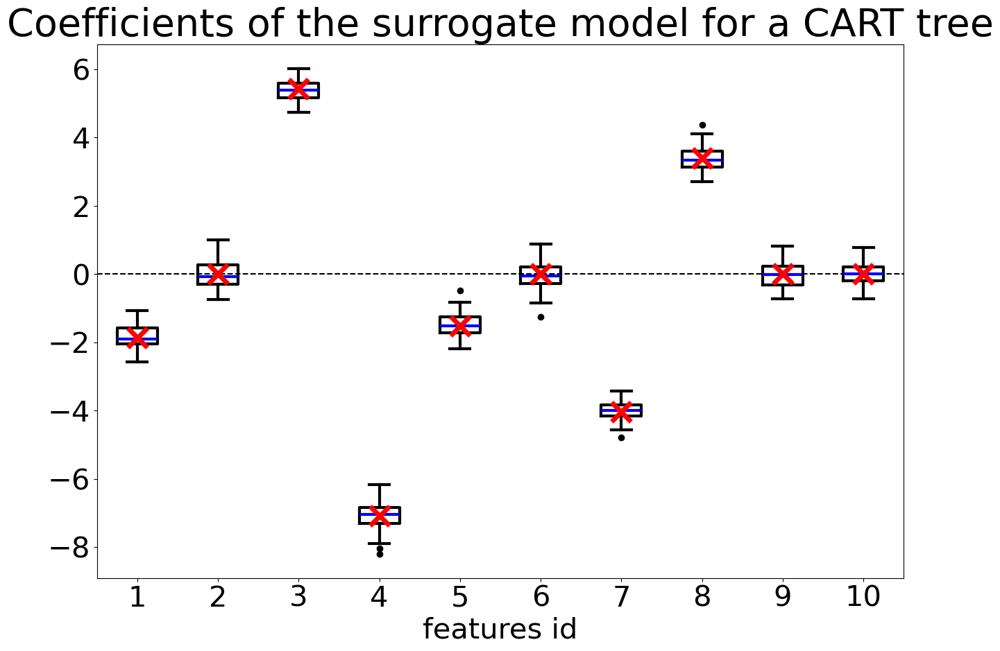

In [5]:
# -*- coding: utf-8 -*-
"""

@author: dgarreau

In this experiment we check our theoretical predictions for a CART tree. This 
is Figure 11 in the paper.

"""

import numpy as np
import matplotlib.pyplot as plt

import lime
import lime.lime_tabular

from sklearn.tree import DecisionTreeRegressor

from utils.plot_functions import plot_whisker_boxes

from utils.aux_functions import get_training_data_stats
from utils.aux_functions import format_coefs
from utils.aux_functions import uniform_sample

from theory.tree import compute_beta_tree

if __name__ == "__main__":
    
    # number of experiments
    n_exp = 100
    
    # number of perturbed samples
    n_samples = 5000
    
    # bandwidth parameter
    nu = 10

    # number of bins along each dimension
    p = 4
    
    # for reproducibility
    np.random.seed(3)

    # dimension of the ambient space
    dim = 10
    
    # we work on the [-10,10]^dim square
    theo_boundaries = np.zeros((dim,2))
    theo_boundaries[:,0] = -10*np.ones((dim,))
    theo_boundaries[:,1] = 10*np.ones((dim,))

    # function to regress is the sum of coordinates
    def my_function(data):   
        return np.sum(data,1)

    # training set
    n_train = 1000
    train_data = uniform_sample(theo_boundaries,n_train)
    y_train = my_function(train_data)
    
    # getting summary statistics of the train data
    my_stats = get_training_data_stats(train_data,p)
    
    # creating the tree regressor
    depth = 3
    tree_regressor = DecisionTreeRegressor(random_state=0,max_depth=depth)
    
    # let us train it
    tree_regressor.fit(train_data,y_train)

    # example to explain
    xi = np.random.uniform(-10,10,(dim,))
    
    # let us get the empirical explanations
    explainer = lime.lime_tabular.LimeTabularExplainer(train_data, 
                                                       mode='regression',
                                                       feature_selection='none',
                                                       training_data_stats=my_stats,
                                                       kernel_width=nu)
    
    # get the empirical explanations
    beta_emp_store = np.zeros((n_exp,dim+1))
    for i_exp in range(n_exp):
        
        if np.mod(i_exp + 1,10) == 0:
            s_exp = "Experiment {} / {} is running...".format(i_exp + 1,n_exp)
            print(s_exp)
        
        exp = explainer.explain_instance(xi,tree_regressor.predict,num_samples=n_samples)
        beta_emp_store[i_exp,:] = format_coefs(exp)

    # get the theory 
    # this can take a while if dim or depth are not small
    print("Computing the theory...")
    beta_theo = compute_beta_tree(xi,nu,tree_regressor,my_stats)

#    #################################################################


    # plot empirical vs theory
    fig, ax = plt.subplots(figsize=(15,10))
    plot_whisker_boxes(beta_emp_store,ax,theo=beta_theo,title=r"Coefficients of the surrogate model for a CART tree")

    s_name = str(out_path("tree_explanation"))
    fig.savefig(s_name + '.pdf',format='pdf',bbox_inches = 'tight',pad_inches = 0) 

## 2D Kernel

Experiment number 0 running...
Experiment number 1 running...
Experiment number 2 running...
Experiment number 3 running...
Experiment number 4 running...
Experiment number 5 running...
Experiment number 6 running...
Experiment number 7 running...
Experiment number 8 running...
Experiment number 9 running...


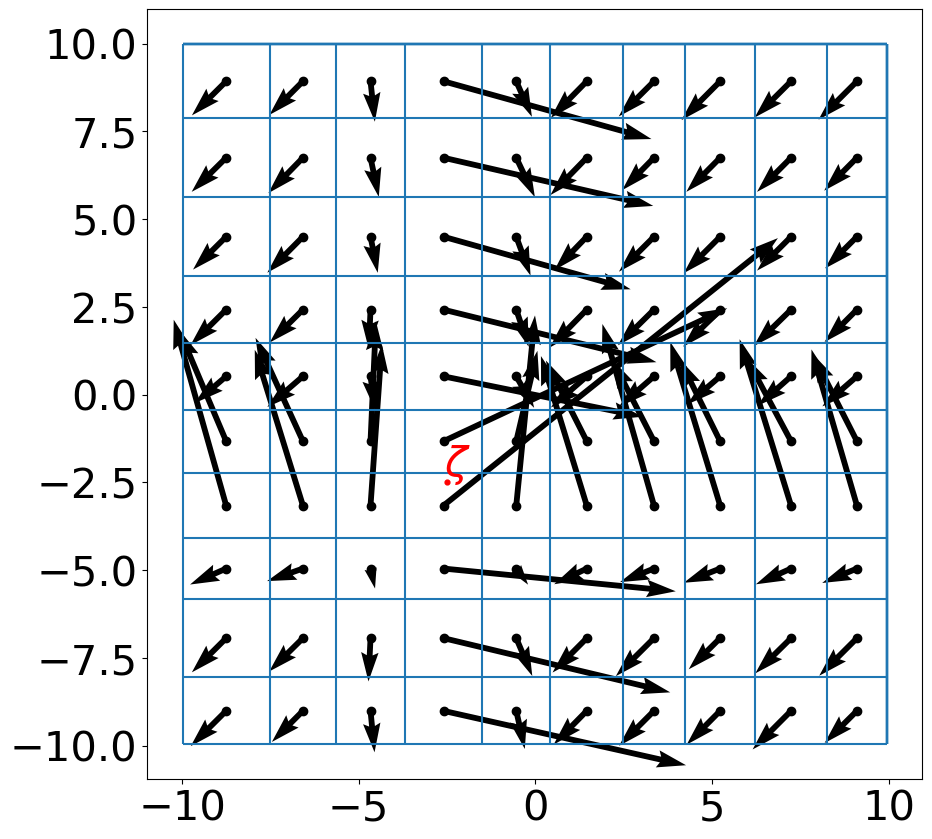

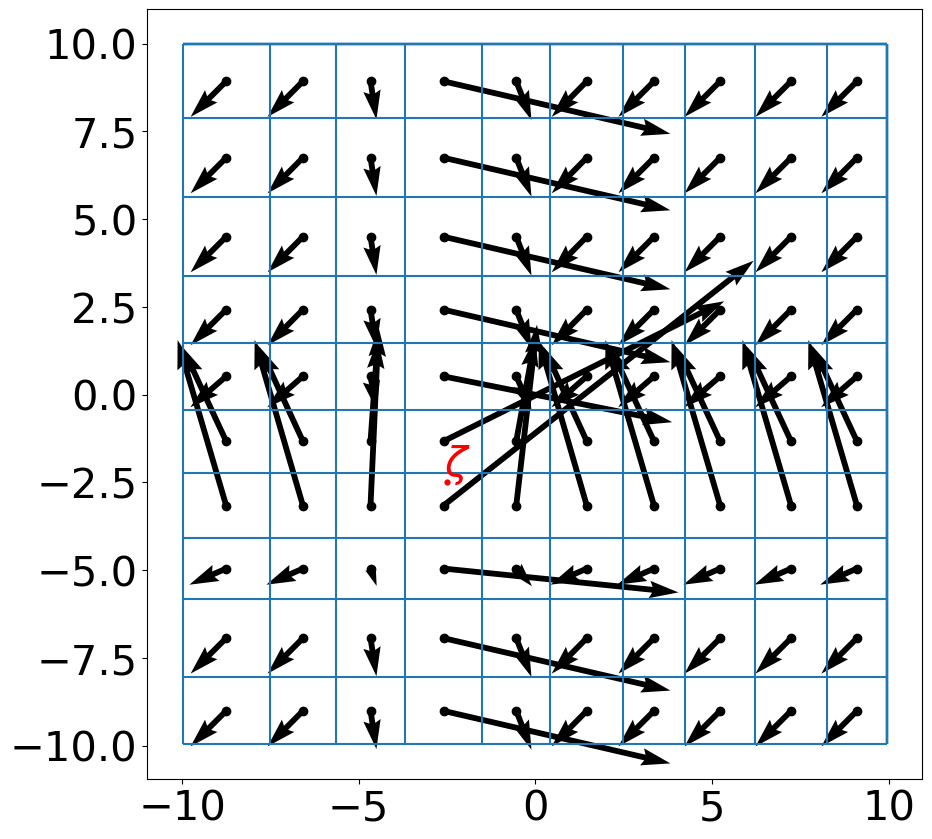

In [3]:
# -*- coding: utf-8 -*-
"""

@author: dgarreau

Looking at explanations for a RBF kernel function in dimension 2. Since the 
explanations do not depend on the exact value of xi, we plot one explanation 
per 2-dimensional bin at the center. This is Figure 14 in the paper.

"""

import numpy as np
import matplotlib.pyplot as plt

import lime
import lime.lime_tabular

from utils.aux_functions import get_training_data_stats
from utils.aux_functions import get_grid_params
from utils.aux_functions import format_coefs

from utils.plot_functions import plot_grid

from theory.kernel import compute_beta_gk

if __name__ == "__main__":
    
    # number of experiments
    n_exp = 10
    
    # number of perturbed samples
    n_samples = 1000
    
    # for reproducibility
    np.random.seed(3)

    # dimension of the ambient space
    dim = 2

    # our model is a kernel function
    zeta = np.array([-2.5,-2.5])
    gamma = 1
    def my_model(array):
        return np.exp(-np.sum(np.square(array-zeta),1)/(2*gamma**2))

    x_min = -10
    x_max = 10
    y_min = x_min
    y_max = x_max

            
    # training set
    n_train = 1000
    train = np.random.uniform(x_min,x_max,(n_train,dim))

    # bandwidth parameter
    nu = 1
    
    # number of bins along each dimension
    p = 10

    # getting the data summary
    my_stats = get_training_data_stats(train,p)
    
    # getting the parameters of the grid            
    bins_middle_points,bins_left_boundaries,bins_right_boundaries = get_grid_params(my_stats)

            
    # creating the explainer
    explainer = lime.lime_tabular.LimeTabularExplainer(train, 
                                                       mode='regression',
                                                       feature_selection='none',
                                                       training_data_stats=my_stats,
                                                       kernel_width=nu)

    # we will store the empirical result in this array
    beta_emp_store = np.zeros((p,p,n_exp,dim+1))
    
    # main loop
    for i_exp in range(n_exp):
        
        s_exp = "Experiment number {} running...".format(i_exp)
        print(s_exp)
        
        for i in range(p):
            for j in range(p):
                
                # take xi in the middle of the box 
                xi = bins_middle_points[i,j,:]
                
                # getting the explanation
                exp = explainer.explain_instance(xi, 
                                                 my_model,
                                                 num_samples=n_samples)

                # getting the coefficients of the local model
                beta_emp_store[i,j,i_exp,:] = format_coefs(exp)
                              
    # averaging over all experiments
    beta_mean = np.mean(beta_emp_store[:,:,:,1:],2)

    # theoretical values
    beta_theo = np.zeros((p,p,2))
    for i in range(p):
        for j in range(p):
            xi = np.array([bins_middle_points[i,j,0],bins_middle_points[i,j,1]])
            beta_theo[i,j,:] = compute_beta_gk(xi,nu,zeta,gamma,my_stats)[1:]
    
#    # looking at the norm can be usefule to determine the size of the arrows
#    beta_norm = np.zeros((p,p))
#    for i in range(p):
#        for j in range(p):
#            beta_norm[i,j] = np.linalg.norm(beta_mean[i,j,:])

    ###########################################################################
    
    # first figure: empirical
    fig, ax = plt.subplots(figsize=(10,10))
    plot_grid(beta_mean,
              ax,
              my_stats,
              zeta,
              scale=100)
        
    # now the theory
    fig, ax = plt.subplots(figsize=(10,10))
    plot_grid(beta_theo,
              ax,
              my_stats,
              zeta,
              scale=100)
        
    # saving the fig
    s_name = str(out_path("two-dimensional_kernel_vector_field"))
    fig.savefig(s_name + '.pdf',format='pdf',bbox_inches = 'tight',pad_inches = 0)  
            